In [4]:
from edgeml import edgeml

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from sklearn.model_selection import LeaveOneGroupOut

from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
#from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix

In [5]:
# get the API key from the settings of your project
project = edgeml.getProject("https://app.edge-ml.org", "zfOAqoW+L7b/NzeoMPtdqqn8jVkk5G9Iy8dzT27eCEnm+GiYlHwd1BMz6mcLJPZfupbs0n75xttwqwsCOceJig==")
project

fetching project...


{'datasets': [{'sensors': [{'name': 'alpha',
     'data': [{'timestamp': 1658487383242, 'datapoint': 358.87},
      {'timestamp': 1658487383259, 'datapoint': 359.46},
      {'timestamp': 1658487383276, 'datapoint': 0.19},
      {'timestamp': 1658487383293, 'datapoint': 358.59},
      {'timestamp': 1658487383310, 'datapoint': 359.64},
      {'timestamp': 1658487383327, 'datapoint': 0.38},
      {'timestamp': 1658487383343, 'datapoint': 0.74},
      {'timestamp': 1658487383359, 'datapoint': 0.63},
      {'timestamp': 1658487383376, 'datapoint': 0.2},
      {'timestamp': 1658487383393, 'datapoint': 359.22},
      {'timestamp': 1658487383410, 'datapoint': 358.39},
      {'timestamp': 1658487383426, 'datapoint': 357.51},
      {'timestamp': 1658487383443, 'datapoint': 356.58},
      {'timestamp': 1658487383460, 'datapoint': 356.41},
      {'timestamp': 1658487383476, 'datapoint': 356.33},
      {'timestamp': 1658487383493, 'datapoint': 356.15},
      {'timestamp': 1658487383509, 'datapoint'

In [6]:
project_datasets = project["datasets"]
#print(project_datasets)

data = {}

for dataset in project_datasets:
    if not dataset["labels"] or not dataset["labels"][0]:
        continue;
    for sensor in dataset["sensors"]:
        for datapoint in sensor["data"]:
            timestamp = datetime.datetime.utcfromtimestamp(datapoint["timestamp"]/1000)
            if timestamp not in data:
                data[timestamp] = {"label":dataset["labels"][0][0]["name"]}
            data[timestamp][sensor["name"]] = datapoint["datapoint"]


In [7]:
df = pd.DataFrame.from_dict(data,"index").sort_index()
df

,label,x0,y0,z0,x,y,z,alpha,beta,gamma
2022-07-22 10:56:23.293,car,-1.04,-0.09,1.44,0.20,-3.54,-7.66,-116.61,122.91,53.06
2022-07-22 10:56:23.309,car,-1.84,-0.58,1.58,-0.31,-3.73,-7.58,-140.32,144.67,36.17
2022-07-22 10:56:23.326,car,-2.67,-1.86,2.20,-0.83,-4.68,-7.02,-133.88,125.95,8.39
2022-07-22 10:56:23.343,car,-2.87,-2.29,3.01,-0.70,-4.68,-6.25,-129.69,72.73,-28.05
2022-07-22 10:56:23.359,car,-2.82,-2.24,2.32,-0.50,-4.30,-6.98,-127.92,43.31,-49.26
...,...,...,...,...,...,...,...,...,...,...
2022-07-23 15:03:24.747,table,0.01,0.00,0.04,0.02,-0.11,-9.77,0.01,-0.04,-0.07
2022-07-23 15:03:24.764,table,0.01,0.00,0.03,0.01,-0.12,-9.77,-0.04,-0.06,-0.08
2022-07-23 15:03:24.780,table,0.01,0.00,0.05,0.01,-0.11,-9.76,0.10,-0.02,-0.01
2022-07-23 15:03:24.797,table,-0.01,0.00,0.05,-0.01,-0.12,-9.76,0.09,-0.12,0.02


In [8]:
window_size = '5000ms'
df_features = pd.DataFrame(df['label'])
df_features['mean_alpha'] = df['alpha'].rolling(window_size).mean()
df_features['mean_beta'] = df['beta'].rolling(window_size).mean()
df_features['mean_gamma'] = df['gamma'].rolling(window_size).mean()
df_features['mean_x'] = df['x'].rolling(window_size).mean()
df_features['mean_y'] = df['y'].rolling(window_size).mean()
df_features['mean_z'] = df['z'].rolling(window_size).mean()
df_features['mean_x0'] = df['x0'].rolling(window_size).mean()
df_features['mean_y0'] = df['y0'].rolling(window_size).mean()
df_features['mean_z0'] = df['z0'].rolling(window_size).mean()

df_features['var_alpha'] = df['alpha'].rolling(window_size).var()
df_features['var_beta'] = df['beta'].rolling(window_size).var()
df_features['var_gamma'] = df['gamma'].rolling(window_size).var()
df_features['var_x'] = df['x'].rolling(window_size).var()
df_features['var_y'] = df['y'].rolling(window_size).var()
df_features['var_z'] = df['z'].rolling(window_size).var()
df_features['var_x0'] = df['x0'].rolling(window_size).var()
df_features['var_y0'] = df['y0'].rolling(window_size).var()
df_features['var_z0'] = df['z0'].rolling(window_size).var()

df_features['median_alpha'] = df['alpha'].rolling(window_size).median()
df_features['median_beta'] = df['beta'].rolling(window_size).median()
df_features['median_gamma'] = df['gamma'].rolling(window_size).median()
df_features['median_x'] = df['x'].rolling(window_size).median()
df_features['median_y'] = df['y'].rolling(window_size).median()
df_features['median_z'] = df['z'].rolling(window_size).median()
df_features['median_x0'] = df['x0'].rolling(window_size).median()
df_features['median_y0'] = df['y0'].rolling(window_size).median()
df_features['median_z0'] = df['z0'].rolling(window_size).median()



df_features = df_features.dropna()
df_features

,label,mean_alpha,mean_beta,mean_gamma,mean_x,mean_y,mean_z,mean_x0,mean_y0,mean_z0,...,var_z0,median_alpha,median_beta,median_gamma,median_x,median_y,median_z,median_x0,median_y0,median_z0
2022-07-22 10:56:23.309,car,-128.465000,133.790000,44.615000,-0.055000,-3.635000,-7.620000,-1.440000,-0.335000,1.510000,...,0.009800,-128.465,133.79,44.615,-0.055,-3.635,-7.62,-1.440,-0.335,1.510
2022-07-22 10:56:23.326,car,-130.270000,131.176667,32.540000,-0.313333,-3.983333,-7.420000,-1.850000,-0.843333,1.740000,...,0.163600,-133.880,125.95,36.170,-0.310,-3.730,-7.58,-1.840,-0.580,1.580
2022-07-22 10:56:23.343,car,-130.125000,116.565000,17.392500,-0.410000,-4.157500,-7.127500,-2.105000,-1.205000,2.057500,...,0.512292,-131.785,124.43,22.280,-0.505,-4.205,-7.30,-2.255,-1.220,1.890
2022-07-22 10:56:23.359,car,-129.684000,101.914000,4.062000,-0.428000,-4.186000,-7.098000,-2.248000,-1.412000,2.110000,...,0.398000,-129.690,122.91,8.390,-0.500,-4.300,-7.02,-2.670,-1.860,2.200
2022-07-22 10:56:23.376,car,-126.013333,88.616667,-8.140000,-0.375000,-4.125000,-7.561667,-2.296667,-1.525000,1.668333,...,1.488817,-128.805,97.82,-9.830,-0.405,-4.060,-7.30,-2.605,-1.975,1.890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-23 15:03:24.747,table,29.713914,0.057095,-0.006177,-0.002333,-0.113367,-9.761100,-0.003900,0.002233,0.044767,...,0.000081,0.000,0.01,0.000,0.000,-0.110,-9.76,0.000,0.000,0.040
2022-07-23 15:03:24.764,table,29.714006,0.056881,-0.006239,-0.002300,-0.113400,-9.761133,-0.003867,0.002200,0.044733,...,0.000082,0.000,0.01,0.000,0.000,-0.110,-9.76,0.000,0.000,0.040
2022-07-23 15:03:24.780,table,29.714526,0.056697,-0.006208,-0.002233,-0.113433,-9.761133,-0.003800,0.002133,0.044767,...,0.000082,0.000,0.01,0.000,0.000,-0.110,-9.76,0.000,0.000,0.040
2022-07-23 15:03:24.797,table,28.701380,0.054540,-0.006166,-0.002200,-0.113467,-9.761100,-0.003767,0.002133,0.044833,...,0.000081,0.000,0.01,0.000,0.000,-0.110,-9.76,0.000,0.000,0.045


In [9]:
features = df_features.keys().to_numpy()
features = features[1:,]

In [10]:
var_xyz_df = df_features[["label","var_x","var_y","var_z"]].copy()
mean_xyz_df = df_features[["label","mean_x","mean_y","mean_z"]].copy()
median_xyz_df = df_features[["label","median_x","median_y","median_z"]].copy()
var_abg_df = df_features[["label","var_alpha","var_beta","var_gamma"]].copy()
mean_abg_df = df_features[["label","mean_alpha","mean_beta","mean_gamma"]].copy()
var_xyz_df

,label,var_x,var_y,var_z
2022-07-22 10:56:23.309,car,0.130050,0.018050,0.003200
2022-07-22 10:56:23.326,car,0.265233,0.373033,0.121600
2022-07-22 10:56:23.343,car,0.214200,0.370025,0.423292
2022-07-22 10:56:23.359,car,0.162270,0.281580,0.321820
2022-07-22 10:56:23.376,car,0.146670,0.247590,1.547377
...,...,...,...,...
2022-07-23 15:03:24.747,table,0.000145,0.000087,0.000090
2022-07-23 15:03:24.764,table,0.000146,0.000087,0.000090
2022-07-23 15:03:24.780,table,0.000146,0.000087,0.000090
2022-07-23 15:03:24.797,table,0.000145,0.000087,0.000090


<AxesSubplot: xlabel='label', ylabel='Count'>

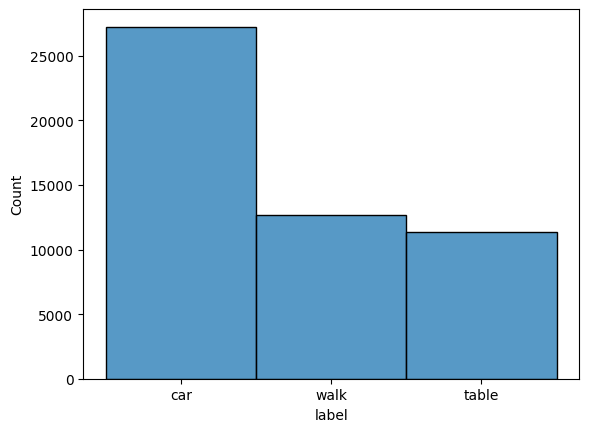

In [11]:
sns.histplot(var_xyz_df,x="label")

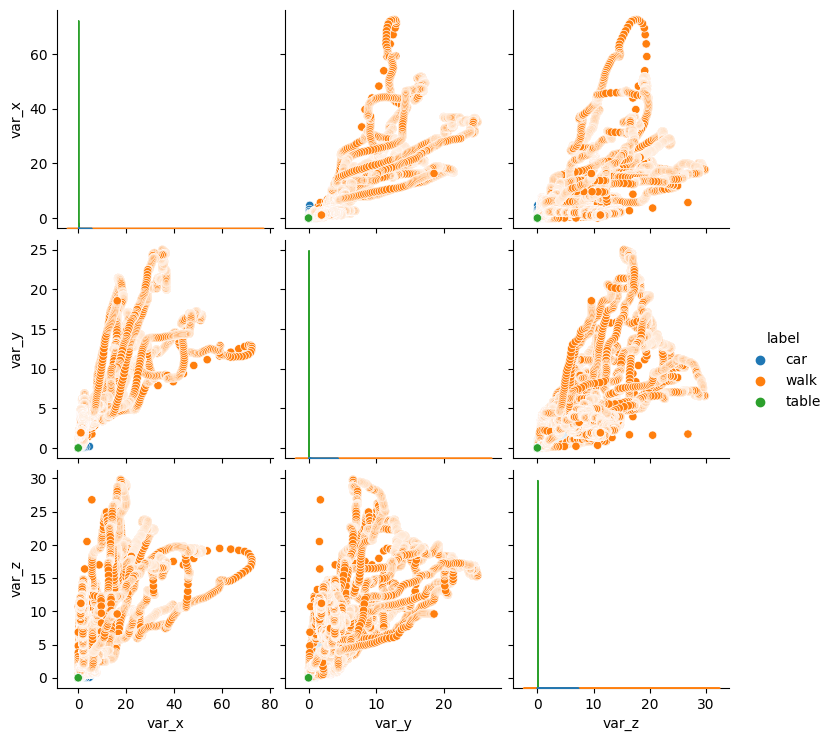

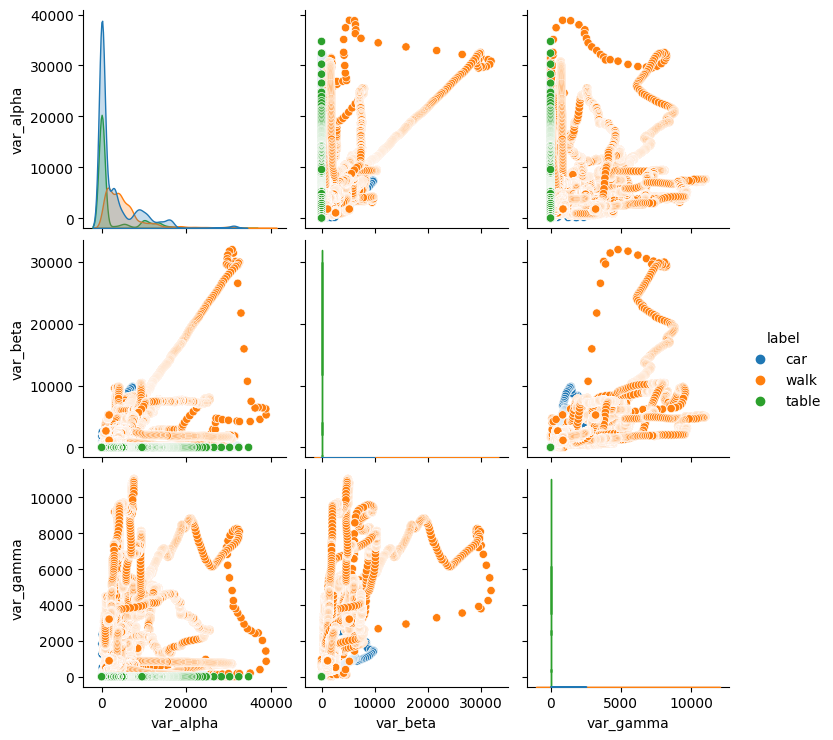

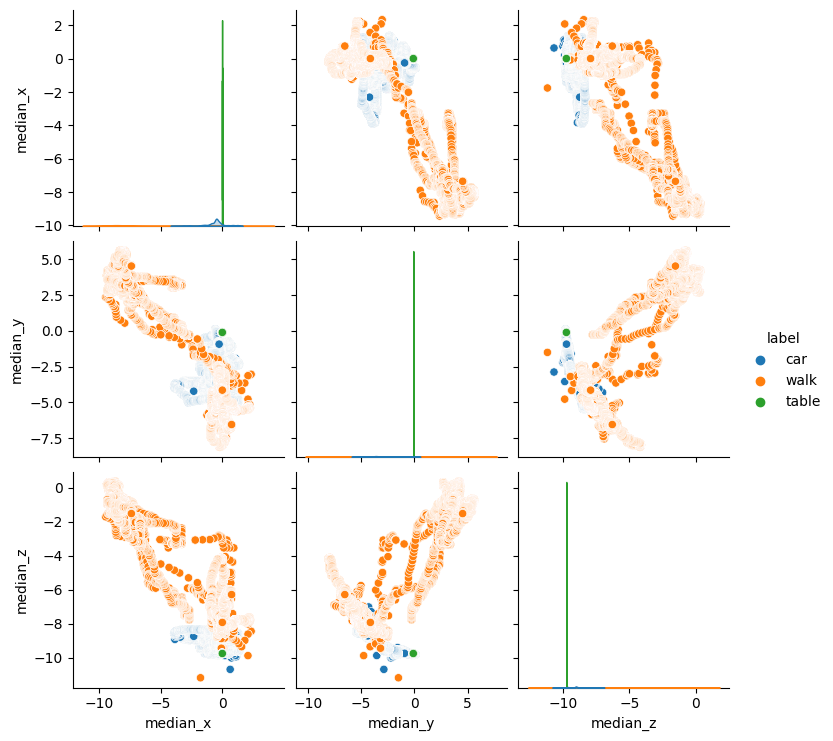

In [12]:
sns.pairplot(var_xyz_df,hue="label")
sns.pairplot(var_abg_df,hue="label")
sns.pairplot(median_xyz_df,hue="label")


/var/folders/ps/nr1l9mcx6nj6265frd4vllcc0000gn/T/ipykernel_82216/417995740.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_walk = var_xyz_df[df["label"] != "walk"]


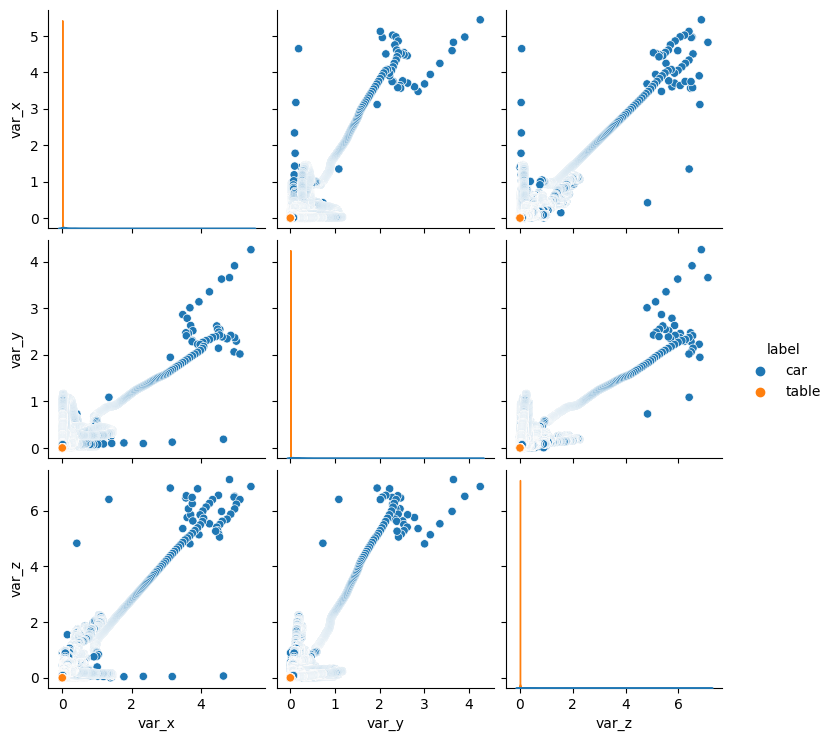

In [13]:
df_no_walk = var_xyz_df[df["label"] != "walk"]
sns.pairplot(df_no_walk, hue="label")

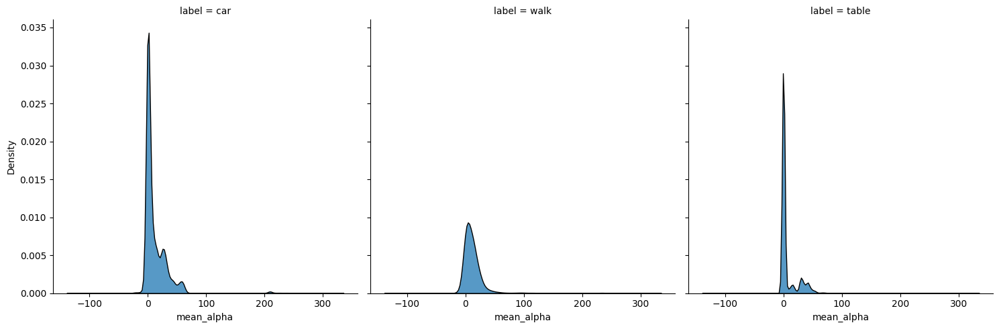

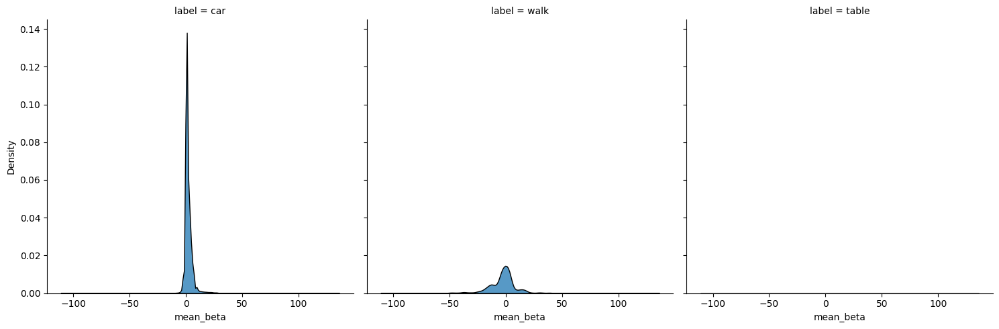

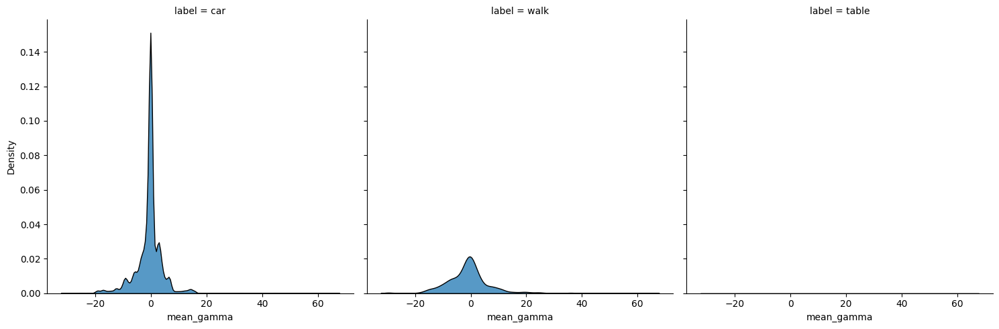

In [14]:
sns.displot(data=mean_abg_df, x="mean_alpha", col="label", multiple="stack", kind="kde")
sns.displot(data=mean_abg_df, x="mean_beta", col="label", multiple="stack", kind="kde")
sns.displot(data=mean_abg_df, x="mean_gamma", col="label", multiple="stack", kind="kde")

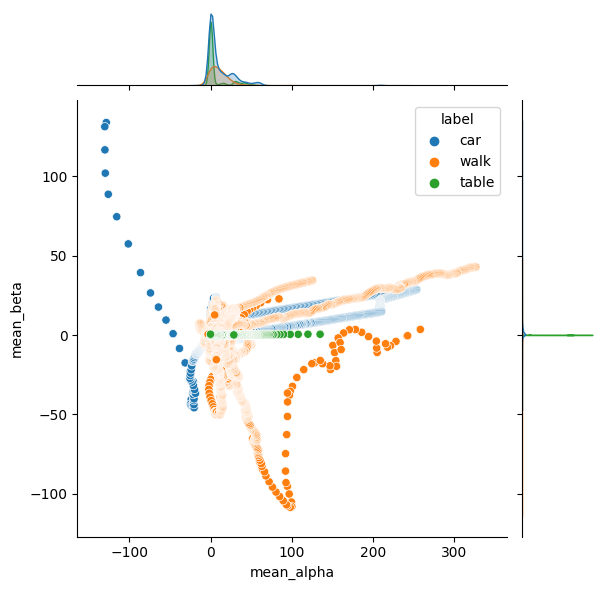

In [15]:
sns.jointplot(data=mean_abg_df, x="mean_alpha", y="mean_beta", hue="label")

In [16]:
# Split into labels and data
data_classes = df_features['label'].unique()
print(data_classes)

X = np.array(df_features.drop(['label'],1))
#y = np.array(df_features['label'])
print(X)
print(X.shape)


#Convert label strings to numeric values
d = dict(zip(data_classes, range(0,len(data_classes))))
print(d)

y = np.array(df_features['label'].map(d, na_action='ignore'))
print(y)
print(X.shape)
print(y.shape)

['car' 'walk' 'table']
[[-1.28465000e+02  1.33790000e+02  4.46150000e+01 ... -1.44000000e+00
  -3.35000000e-01  1.51000000e+00]
 [-1.30270000e+02  1.31176667e+02  3.25400000e+01 ... -1.84000000e+00
  -5.80000000e-01  1.58000000e+00]
 [-1.30125000e+02  1.16565000e+02  1.73925000e+01 ... -2.25500000e+00
  -1.22000000e+00  1.89000000e+00]
 ...
 [ 2.97145260e+01  5.66972477e-02 -6.20795107e-03 ...  0.00000000e+00
   0.00000000e+00  4.00000000e-02]
 [ 2.87013804e+01  5.45398773e-02 -6.16564417e-03 ...  0.00000000e+00
   0.00000000e+00  4.50000000e-02]
 [ 2.87017178e+01  5.46932515e-02 -5.98159509e-03 ...  0.00000000e+00
   0.00000000e+00  4.50000000e-02]]
(51319, 27)
{'car': 0, 'walk': 1, 'table': 2}
[0 0 0 ... 2 2 2]
(51319, 27)
(51319,)


/var/folders/ps/nr1l9mcx6nj6265frd4vllcc0000gn/T/ipykernel_82216/3850390956.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X = np.array(df_features.drop(['label'],1))


In [17]:
'Group'+ (df_features.index.to_series().diff().fillna(np.timedelta64(0,'ms'))/np.timedelta64(800, 'ms')).gt(1).cumsum().add(1).astype(str)
groups = np.array((df_features.index.to_series().diff().fillna(np.timedelta64(0,'ms'))/np.timedelta64(1000, 'ms')).gt(1).cumsum().add(1))
groups

array([ 1,  1,  1, ..., 13, 13, 13])

In [18]:
names = [
    "Nearest Neighbors",
    #"Linear SVM",
    #"RBF SVM",
    #"Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    #"AdaBoost",
    #"Naive Bayes",
    #"QDA",
]

classifiers = [
    KNeighborsClassifier(5),
    #SVC(kernel="linear", C=0.025),
    #SVC(gamma=2, C=1),
    #GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    #AdaBoostClassifier(),
    #GaussianNB(),
    #QuadraticDiscriminantAnalysis(),
]

In [19]:
accuracies = {}
precisions = {}
recalls = {}
f1_scores = {}

for name in names:
    accuracies[name] = []
    precisions[name] = []
    recalls[name] = []
    f1_scores[name] = []

# Perform Leave-One-Subject_Out
logo = LeaveOneGroupOut()
logo.get_n_splits(X, y, groups)

for train_index, test_index in logo.split(X, y, groups):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        #ax = plt.subplot(1, len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)
        y_pred = clf.predict(X_test)

        accuracies[name].append(accuracy_score(y_test, y_pred))
        precisions[name].append(precision_score(y_test, y_pred, average="macro"))
        recalls[name].append(recall_score(y_test, y_pred, average="macro"))
        f1_scores[name].append(f1_score(y_test, y_pred, average="macro"))


values = pd.DataFrame([accuracies,precisions,recalls,f1_scores],index = ["acc", "prec", "rec", "f1"])
values = values.applymap(np.mean)
values

/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer

,Nearest Neighbors,Decision Tree,Random Forest,Neural Net
acc,0.782312,0.962776,0.972918,0.936844
prec,0.435897,0.717949,0.641026,0.679487
rec,0.345212,0.702693,0.628777,0.652006
f1,0.377145,0.709699,0.634708,0.664229


In [20]:
#Importing required libraries
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


accuraciesCV = {}
precisionsCV = {}
recallsCV = {}
f1_scoresCV = {}

for name in names:
    accuraciesCV[name] = []
    precisionsCV[name] = []
    recallsCV[name] = []
    f1_scoresCV[name] = []

#Implementing cross validation
k = 10
kf = KFold(n_splits=k, random_state=None)

for train_index , test_index in kf.split(X):
    X_train , X_test = X[train_index,:],X[test_index,:]
    y_train , y_test = y[train_index] , y[test_index]

    for name, clf in zip(names, classifiers):
        clf.fit(X_train, y_train)
        #score = clf.score(X_test, y_test)
        y_pred = clf.predict(X_test)

        accuraciesCV[name].append(accuracy_score(y_test, y_pred))
        precisionsCV[name].append(precision_score(y_test, y_pred, average="macro"))
        recallsCV[name].append(recall_score(y_test, y_pred, average="macro"))
        f1_scoresCV[name].append(f1_score(y_test, y_pred, average="macro"))

valuesCV = pd.DataFrame([accuraciesCV,precisionsCV,recallsCV,f1_scoresCV],index = ["acc", "prec", "rec", "f1"])
valuesCV = valuesCV.applymap(np.mean)
valuesCV

/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill

,Nearest Neighbors,Decision Tree,Random Forest,Neural Net
acc,0.893447,0.955279,0.973284,0.938347
prec,0.528973,0.747934,0.749628,0.649938
rec,0.484496,0.731268,0.738419,0.622580
f1,0.504376,0.738885,0.743797,0.635459


In [21]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline


rfe = RFE(estimator=DecisionTreeClassifier(), n_features_to_select=5)
model = DecisionTreeClassifier()
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model with 10-fold CV
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)
n_scores = cross_val_score(pipeline, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

# fit RFE
rfe.fit(X, y)
# summarize all features
for i in range(X.shape[1]):
	print('Column: %d (%s), Selected %s, Rank: %.0f' % (i, features[i], rfe.support_[i], rfe.ranking_[i]))

(51319, 27)
(51319,)
Accuracy: 1.000 (0.000)
Column: 0 (mean_alpha), Selected False, Rank: 23
Column: 1 (mean_beta), Selected False, Rank: 19
Column: 2 (mean_gamma), Selected False, Rank: 17
Column: 3 (mean_x), Selected False, Rank: 15
Column: 4 (mean_y), Selected False, Rank: 14
Column: 5 (mean_z), Selected False, Rank: 13
Column: 6 (mean_x0), Selected False, Rank: 12
Column: 7 (mean_y0), Selected False, Rank: 11
Column: 8 (mean_z0), Selected False, Rank: 8
Column: 9 (var_alpha), Selected False, Rank: 10
Column: 10 (var_beta), Selected False, Rank: 9
Column: 11 (var_gamma), Selected True, Rank: 1
Column: 12 (var_x), Selected False, Rank: 20
Column: 13 (var_y), Selected False, Rank: 22
Column: 14 (var_z), Selected False, Rank: 21
Column: 15 (var_x0), Selected False, Rank: 18
Column: 16 (var_y0), Selected False, Rank: 16
Column: 17 (var_z0), Selected True, Rank: 1
Column: 18 (median_alpha), Selected False, Rank: 2
Column: 19 (median_beta), Selected False, Rank: 7
Column: 20 (median_gamm

In [22]:
#not: 'mean_alpha',

"""to_drop = ['label',
           'mean_alpha',
            'mean_beta',
            'mean_gamma',
            'mean_x',
            'mean_y',
            'mean_z',
            'mean_x0',
            'mean_y0',
            'mean_z0',
            'var_alpha',
            'var_beta',
            'var_gamma',
            'var_x',
            'var_y',
            'var_z',
            'var_x0',
            'var_y0',
            'var_z0',
            'median_alpha',
            'median_beta',
            'median_gamma',
            'median_x',
            'median_y',
            'median_z',
            'median_x0',
            'median_y0',
            'median_z0']"""

to_drop = ['label',
           'mean_alpha',
            'mean_beta',
            'mean_gamma',
            'mean_x',
            'mean_y',
            'mean_z',
            'mean_x0',
            'mean_y0',
            'mean_z0',
            'var_alpha',
            'var_beta',
            'var_x',
            'var_y',
            'var_z',
            'var_x0',
            'var_y0',
            'median_beta',
            'median_gamma',
            'median_x',
            'median_y',
            'median_x0',
            'median_z0']

to_drop

['label',
 'mean_alpha',
 'mean_beta',
 'mean_gamma',
 'mean_x',
 'mean_y',
 'mean_z',
 'mean_x0',
 'mean_y0',
 'mean_z0',
 'var_alpha',
 'var_beta',
 'var_x',
 'var_y',
 'var_z',
 'var_x0',
 'var_y0',
 'median_beta',
 'median_gamma',
 'median_x',
 'median_y',
 'median_x0',
 'median_z0']

In [23]:
#Importing required libraries
#from sklearn.model_selection import KFold
#from sklearn.linear_model import LogisticRegression
#from sklearn.metrics import accuracy_score

# Split into labels and data
print(data_classes)


X_RFE = np.array(df_features.drop(to_drop,1))
#y = np.array(df_features['label'])
print(X_RFE)
print(X_RFE.shape)


#Convert label strings to numeric values
print(d)

y_RFE = np.array(df_features['label'].map(d, na_action='ignore'))
print(y_RFE)
print(X_RFE.shape)
print(y_RFE.shape)


['car' 'walk' 'table']
[[ 1.42636050e+02  9.80000000e-03 -1.28465000e+02 -7.62000000e+00
  -3.35000000e-01]
 [ 5.08734900e+02  1.63600000e-01 -1.33880000e+02 -7.58000000e+00
  -5.80000000e-01]
 [ 1.25694362e+03  5.12291667e-01 -1.31785000e+02 -7.30000000e+00
  -1.22000000e+00]
 ...
 [ 3.79845969e-03  8.18851728e-05  0.00000000e+00 -9.76000000e+00
   0.00000000e+00]
 [ 3.81202171e-03  8.12430323e-05  0.00000000e+00 -9.76000000e+00
   0.00000000e+00]
 [ 3.81057197e-03  8.12430323e-05  0.00000000e+00 -9.76000000e+00
   0.00000000e+00]]
(51319, 5)
{'car': 0, 'walk': 1, 'table': 2}
[0 0 0 ... 2 2 2]
(51319, 5)
(51319,)


/var/folders/ps/nr1l9mcx6nj6265frd4vllcc0000gn/T/ipykernel_82216/2941140008.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_RFE = np.array(df_features.drop(to_drop,1))


In [24]:

accuraciesCV_RFE = {}
precisionsCV_RFE = {}
recallsCV_RFE = {}
f1_scoresCV_RFE = {}

for name in names:
    accuraciesCV_RFE[name] = []
    precisionsCV_RFE[name] = []
    recallsCV_RFE[name] = []
    f1_scoresCV_RFE[name] = []

#Implementing cross validation
k = 10
kf_RFE = KFold(n_splits=k, random_state=None)

for train_index_RFE , test_index_RFE in kf_RFE.split(X_RFE):
    X_train_RFE , X_test_RFE = X_RFE[train_index_RFE ,:],X_RFE[test_index_RFE ,:]
    y_train_RFE , y_test_RFE = y_RFE[train_index_RFE ] , y_RFE[test_index_RFE ]

    for name, clf in zip(names, classifiers):
        clf.fit(X_train_RFE, y_train_RFE)
        #score = clf.score(X_test, y_test)
        y_pred_RFE = clf.predict(X_test_RFE)

        accuraciesCV_RFE [name].append(accuracy_score(y_test_RFE , y_pred_RFE ))
        precisionsCV_RFE [name].append(precision_score(y_test_RFE , y_pred_RFE , average="macro"))
        recallsCV_RFE [name].append(recall_score(y_test_RFE , y_pred_RFE , average="macro"))
        f1_scoresCV_RFE [name].append(f1_score(y_test_RFE , y_pred_RFE , average="macro"))

valuesCV_RFE  = pd.DataFrame([accuraciesCV_RFE ,precisionsCV_RFE ,recallsCV_RFE ,f1_scoresCV_RFE ],index = ["acc", "prec", "rec", "f1"])
valuesCV_RFE  = valuesCV_RFE .applymap(np.mean)
valuesCV_RFE

/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill

,Nearest Neighbors,Decision Tree,Random Forest,Neural Net
acc,0.970323,0.959040,0.957734,0.937549
prec,0.798692,0.699110,0.749262,0.799353
rec,0.787907,0.683426,0.733561,0.775693
f1,0.792886,0.690626,0.740520,0.785703


In [25]:
# Gaussian Process
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF

print(X_train.shape)
print(y_train.shape)
print(X_test.reshape(-1,1).shape)

gp = GaussianProcessRegressor(kernel=RBF())

# uses fit on the same data as above, defined in X, Y
#gp.fit(X_train_RFE,y_train_RFE)

# prediction with variance
#y_gp_pred, y_gp_pred_var = gp.predict(X_test_RFE,return_std=True)

#print(gp.kernel_)

(46188, 27)
(46188,)
(138537, 1)


In [26]:
# Bayesian Optimization
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from skopt.space import Integer
from skopt.utils import use_named_args
from skopt import gp_minimize

# define the model
model = KNeighborsClassifier()
# define the space of hyperparameters to search
search_space = [Integer(1, 10, name='n_neighbors'), Integer(1, 5, name='p')]

# define the function used to evaluate a given configuration
@use_named_args(search_space)
def evaluate_model(**params):
    # something
    model.set_params(**params)
    # calculate 5-fold cross validation
    result = cross_val_score(model, X_train_RFE, y_train_RFE, cv=5, n_jobs=-1, scoring='accuracy')
    # calculate the mean of the scores
    estimate = mean(result)
    return 1.0 - estimate

# perform optimization with Gauss Process
result = gp_minimize(evaluate_model, search_space)
# summarizing finding:
print('Best Accuracy: %.3f' % (1.0 - result.fun))
print('Best Parameters: n_neighbors=%d, p=%d' % (result.x[0], result.x[1]))


/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  

Best Accuracy: 0.974
Best Parameters: n_neighbors=5, p=1


In [27]:
import sklearn
import autosklearn.classification


#X, y = sklearn.datasets.load_digits(return_X_y=True)
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, random_state=1)
automl = autosklearn.classification.AutoSklearnClassifier()
automl.fit(X_train, y_train)
y_hat = automl.predict(X_test)
print("Accuracy score", sklearn.metrics.accuracy_score(y_test, y_hat))

ModuleNotFoundError: No module named 'autosklearn'

In [ ]:
# Auto ML cross validation
automl = autosklearn.classification.AutoSklearnClassifier(
    time_left_for_this_task=120,
    per_run_time_limit=30,
    tmp_folder="/tmp/autosklearn_resampling_example_tmp",
    disable_evaluator_output=False,
    resampling_strategy="cv",
    resampling_strategy_arguments={"folds": 10},
)
automl.fit(X_train, y_train, dataset_name="CarWalkTable")

print("Before re-fit")
predictions = automl.predict(X_test)
print("Accuracy score CV", sklearn.metrics.accuracy_score(y_test, predictions))

# Re-Fitting
# During fit(), models are fit on individual cross-validation folds. To use all available data, we call refit() which trains all models in the final ensemble on the whole dataset.
print("After re-fit")
automl.refit(X_train.copy(), y_train.copy())
predictions = automl.predict(X_test)
print("Accuracy score CV", sklearn.metrics.accuracy_score(y_test, predictions))

In [34]:
import time as timelib
from datetime import datetime
from edgeml.predictor import Predictor, PredictorError
from EdgeMLRndForrest_python import score
#from EdgeMLDecTree_python import score


df_edgeml = df.drop('label',1)
df_edgeml = df_edgeml.drop(df_edgeml[df_edgeml.index == "2022-07-22 11:07:03"].index)
#print(df_edgeml)

p = Predictor(
    predictor = lambda input: score(input),
    sensors = ['alpha', 'beta', 'gamma', 'x0', 'y0', 'z0', 'x', 'y', 'z'],
    window_size = 100,
    labels = ['car', 'walk', 'table'],
    scaler = {'scale': [19.352500000000003, 0.1525, 0.19352500000000003, 1.0, 0.7064562270234316, 0.52741242, 0.9438882405513817, 1.5825, 2.37, 2.1375, 36.16, 0.36375, 0.3616, 1.0, 1.04433588992871, 1.1388326325000002, 1.2238741396992037, 2.2775, 2.6625, 2.1550000000000002, 15.614999999999998, 0.16375, 0.15614999999999998, 1.0, 0.9522026620469596, 0.9393641949999999, 0.930195123222176, 2.4475, 3.115, 2.9175, 94.87499999999999, 0.9125, 0.94875, 1.0, 0.8694905491289409, 0.7913674425, 1.3939325238160039, 0.6875, 2.81, 2.53, 367.3025, 3.7075, 3.673025, 1.0, 1.2069170720707714, 1.5115038099999998, 4.226379522931828, 3.3000000000000003, 6.34, 4.2875000000000005, 131.995, 1.4949999999999992, 1.3199499999999986, 1.0, 0.9151081334547534, 0.8686545299999999, 1.1058347861194981, 5.172499999999999, 1.2975000000000012, 1.25, 26.58, 0.24625000000000002, 0.2657999999999999, 1.0, 22.274688915836435, 500.30070076000004, 23.10043066475372, 47.7025, 54.977500000000006, 43.857499999999995, 65.65, 0.83375, 0.6565000000000001, 1.0, 20.283448655756075, 415.11548980750007, 20.88635433524221, 42.7375, 51.065, 45.57, 130.97249999999997, 1.4725, 1.309725, 1.0, 19.780589889177563, 394.26538844250007, 21.28313307048203, 33.940000000000005, 48.190000000000005, 39.205], 'center': [-0.29000000000000004, 0.0, -0.0029, 100.0, 0.17371027312426385, 0.030175414999999997, 0.2565905394910363, 0.315, 0.655, -0.335, 1.37, 0.01, 0.0137, 100.0, 0.1924433665447708, 0.037034495, 0.3838714434904469, 0.595, 0.84, -0.24, 4.68, 0.05, 0.046799999999999994, 100.0, 0.34450461217678446, 0.11868367, 0.40548114206677155, 0.855, 1.11, -0.965, -43.21500000000001, -0.4125, -0.43215000000000015, 100.0, 0.18272149088133746, 0.033387494999999996, 0.6098443361905149, 0.01, 1.15, -0.87, -324.895, -3.2375000000000003, -3.24895, 100.0, 0.1989999373308819, 0.039600979999999994, 3.597622664900909, -2.12, 4.035, -3.68, -905.02, -9.03, -9.0502, 100.0, 0.34334307992483915, 0.11788465999999996, 9.058789597519237, -8.135000000000002, 9.79, -9.79, 0.08500000000000002, 0.0, 0.0008500000000000003, 100.0, 1.0230625472400707, 1.046710215, 1.070198303346283, 2.625, 3.035, -2.57, 0.13999999999999999, 0.005, 0.0013999999999999998, 100.0, 1.4064848052855168, 1.9781996549999998, 1.7914784939784538, 3.4450000000000003, 5.02, -3.485, -0.48499999999999993, 0.0, -0.004849999999999999, 100.0, 0.5045184004988037, 0.25454564, 1.2410788238416617, 0.41, 2.95, -0.645], 'name': 'RobustScaler'},
    windowing_mode = "sample"
)


for t, row in df_edgeml.iterrows():
    #time = int(t) / 1e3
    time  = int(datetime.timestamp(datetime.strptime(str(t), "%Y-%m-%d %H:%M:%S.%f")))
    for key, valStr in row.items():#row.iteritems():
        p.add_datapoint(key, float(valStr), time)

    try:
        print(datetime.fromtimestamp(time), p.predict())
        timelib.sleep(0.00000001)
    except PredictorError:
        pass

/var/folders/ps/nr1l9mcx6nj6265frd4vllcc0000gn/T/ipykernel_82216/2138794002.py:8: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df_edgeml = df.drop('label',1)


2022-07-22 10:56:23 {'prediction': 'car', 'result': [0.58, 0.02, 0.4]}
2022-07-22 10:56:23 {'prediction': 'car', 'result': [0.8300000000000001, 0.04, 0.13]}
2022-07-22 10:56:23 {'prediction': 'car', 'result': [0.84, 0.03, 0.13]}
2022-07-22 10:56:23 {'prediction': 'car', 'result': [0.78, 0.02, 0.2]}
2022-07-22 10:56:23 {'prediction': 'car', 'result': [0.78, 0.02, 0.2]}
2022-07-22 10:56:23 {'prediction': 'car', 'result': [0.7000000000000001, 0.01, 0.29]}


KeyboardInterrupt: 

In [40]:
from sklearn.datasets import load_iris
from sklearn_porter import Porter
#from sklearn_porter import port, save, make, test

# 2. Port or transpile an estimator:
output = Porter(clf, language='js', template='attached')
print(output)

# 3. Save the ported estimator:
src_path, json_path = output(clf, language='js', template='exported', directory='/tmp')
print(src_path, json_path)

# 4. Make predictions with the ported estimator:
y_classes, y_probas = make(clf, X[:10], language='js', template='exported')
print(y_classes, y_probas)

# 5. Test always the ported estimator by making an integrity check:
score = test(clf, X[:10], language='js', template='exported')
print(score)


ImportError: cannot import name 'port' from 'sklearn_porter' (/Users/marvin/KS_ML_Project/lib/python3.8/site-packages/sklearn_porter/__init__.py)